# Intelligent Robotics: Assignment 1

# Prithvi Poddar (17191)

## Problem 1
**Attractive potential field**

In [1]:
"""
Created on Fri Feb 12 11:55:55 2021

@author: prithvi
"""

import numpy as np
import matplotlib.pyplot as plt

def make_space(limit):
    """
    This function gives the x and y coordinates for genrating the quiver plot

    Parameters
    ----------
    limit : int
        Generates the space from -limit to +limit on both x and y axes

    Returns
    -------
    X : np.array
        X coordinates
    Y : np.array
        Y coordinates

    """
    X = np.linspace(-limit, limit, (2*limit)+1)
    Y = np.linspace(-limit, limit, (2*limit)+1)
    return X, Y

In [2]:
def seek_goal(d, theta, r, alpha, s):
    """
    Returns the gradients along the x and y directions

    Parameters
    ----------
    d : float
        distance from goal
    theta : float
        angle from the goal
    r : float
        radius of the goal
    alpha : float
        sacling factor
    s : float
        boundary beyoud which potential is constant

    Returns
    -------
    del_x : float
        change in the x coordinate
    del_y : float 
        change in y coordinate

    """
    if (d<r):
        del_x = 0
        del_y = 0
        
    
    elif (d>=r and d<=s+r):
        del_x = -alpha * (d - r) * np.cos(theta)
        del_y = -alpha * (d - r) * np.sin(theta)
       
    
    else:
        del_x = -alpha * s * np.cos(theta)
        del_y = -alpha * s * np.sin(theta)
        
    return del_x, del_y

In [3]:
def go_to_goal(X, Y, goal_x, goal_y, r, s, alpha):
    """
    Generates the gradients of all the coordinates in the X and Y linspace,
    for the quiver plot

    Parameters
    ----------
    X : np.linspace
        X coordinates
    Y : np.linspace
        Y coordinates
    goal_x : float
        x coordinate of goal
    goal_y : float
        y coordinate of the goal
    r : float
        radius of goal
    s : float
        
    alpha : float
        

    Returns
    -------
    del_x_att : 2D array
        contains the gradients of the x coordinates
    del_y_att : 2D array
        contains the gradients of the y coordinates

    """
    
    del_x_att = np.zeros((len(X), len(Y)))
    del_y_att = np.zeros((len(X), len(Y)))
    
    for i in range(len(X)):
        for j in range(len(Y)):
            dist = np.sqrt((X[i]-goal_x)**2 + (Y[j]-goal_y)**2)
            theta = np.arctan2((X[i]-goal_x), (Y[j]-goal_y))
            del_x_att[i][j], del_y_att[i][j] = seek_goal(dist, theta, r, alpha, s)
            
    return del_x_att, del_y_att

In [156]:
def get_circles(goal_x=None, goal_y=None, goal_r=None, obs_x=None, obs_y=None, obs_r=None):
    """
    Auxilary function to generate the circles for the goal and obstacles for visualization

    Parameters
    ----------
    goal_x : float, optional
        
    goal_y : float, optional
        
    goal_r : float, optional
       
    obs_x : list of float values, optional
        
    obs_y : list of float values, optional
        
    obs_r : list of float values, optional

    Returns
    -------
    circles : plt.Circle
        pathes for the circles to be plotted

    """
    if (obs_x == None):
        circles = [plt.Circle((goal_y, goal_x), goal_r, color='red')]
        
    elif (goal_x == None):
        circles = []
        for i in range(len(obs_x)):
            circles.append(plt.Circle((obs_y[i], obs_x[i]), obs_r[i]))
            
    else:
        circles = [plt.Circle((goal_y, goal_x), goal_r, color='red')]
        for i in range(len(obs_x)):
            circles.append(plt.Circle((obs_y[i], obs_x[i]), obs_r[i]))
        
    return circles
    
def plot_circles(circles, color='#FFB6C1'):
    """
    Auxilary function to plot the circles

    Parameters
    ----------
    circles : List of plt.Circle
        
    color : optional
        DESCRIPTION. The default is '#FFB6C1'.

    Returns
    -------
    None.

    """
    fig = plt.gcf()
    ax = plt.gca()
    for circle in circles:
        ax.add_patch(circle)

def plot_quiver(X, Y, circles, del_x, del_y):
    """
    Plots the quiver plot

    Parameters
    ----------
    X : np.linspace
        
    Y : np.linspace
        
    circles : List of plt.Circle
        
    del_x : 2D array
        contains the gradients of the x axis
    del_y : 2D array
        contains the gradients of the y axis

    Returns
    -------
    None.

    """
    plt.figure(figsize=(12,12))
    plt.quiver(X, Y, del_x, del_y)
    plot_circles(circles)
    plt.show()

In [157]:
X, Y = make_space(20)
goal_x = 0
goal_y = 0
goal_r = 5

alpha = 1
s = 20

In [158]:
del_x, del_y = go_to_goal(X, Y, goal_x, goal_y, goal_r, s, alpha)
circles = get_circles(goal_x=goal_x, goal_y=goal_y, goal_r=goal_r)

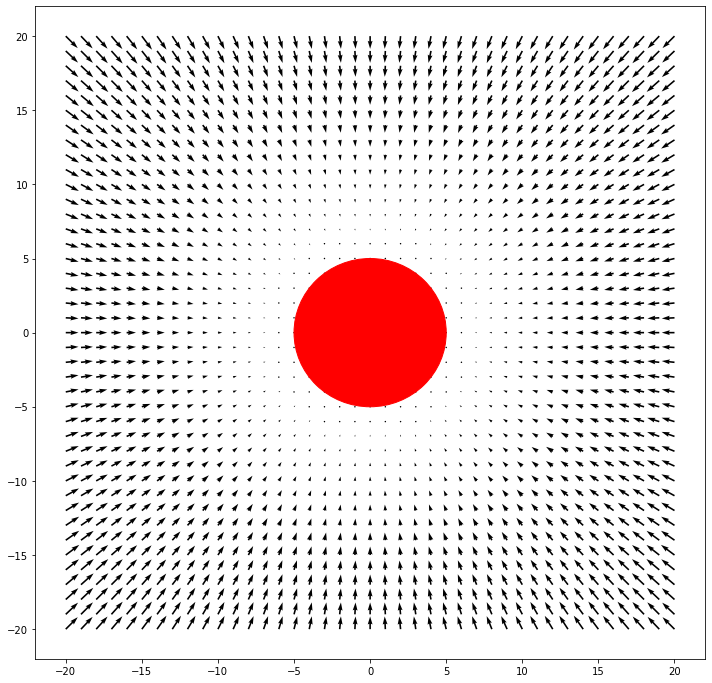

In [159]:
plot_quiver(X, Y, circles, del_x, del_y)

## Problem 2
**Repulsive Potential**

In [160]:
def repel(d, theta, r, beta, s):
    """
    Generates gradients for repulsive potential of obstacles

    Parameters
    ----------
    d : float
        distance from obstacle
    theta : float
        angle from obstacle
    r : float
        radius of obstacles
    beta : float
        scaling parameter
    s : float

    Returns
    -------
    del_x : float
    del_y : float
    """
    if (d<r):
        del_x = 0
        del_y = 0
        
    
    elif (d>=r and d<=s+r):
        del_x = beta * ((1/d)-(1/(s+r))) * np.cos(theta)
        del_y = beta * ((1/d)-(1/(s+r))) * np.sin(theta)
    
    else:
        del_x = 0
        del_y = 0
        
    return del_x, del_y

In [161]:
def avoid_obstacle(X, Y, obs_x, obs_y, obs_r, s, beta):
    """
    Generates gradient of all coordinatesin of the X and Y axes
    to avoid obstacles

    Parameters
    ----------
    X : np.linspace
        X coordinates
    Y : np.linspace
        Y coordinates
    obs_x : list
        x coordinates of obstacels
    obs_y : list
        y coordinates of obstacels
    obs_r : list
        radius of obstacels
    s : float
    beta : float

    Returns
    -------
    del_x_repel : 2D array
    del_y_repel : 2D array
    """
    del_x_repel = np.zeros((len(X), len(Y)))
    del_y_repel = np.zeros((len(X), len(Y)))
    
    for a in range(len(obs_x)):
        for i in range(len(X)):
            for j in range(len(Y)):
                dist = np.sqrt((X[i]-obs_x[a])**2 + (Y[j]-obs_y[a])**2)
                theta = np.arctan2((X[i]-obs_x[a]), (Y[j]-obs_y[a]))
                del_x, del_y = repel(dist, theta, obs_r[a], beta, s)
                del_x_repel[i][j] += del_x 
                del_y_repel[i][j] += del_y
                
    return del_x_repel, del_y_repel

In [162]:
X, Y = make_space(25)
obs_x = [0]
obs_y = [0]
obs_r = [5]
beta = 200
s = 20

In [163]:
del_x, del_y = avoid_obstacle(X, Y, obs_x, obs_y, obs_r, s, beta)
circles = get_circles(obs_x=obs_x, obs_y=obs_y, obs_r=obs_r)

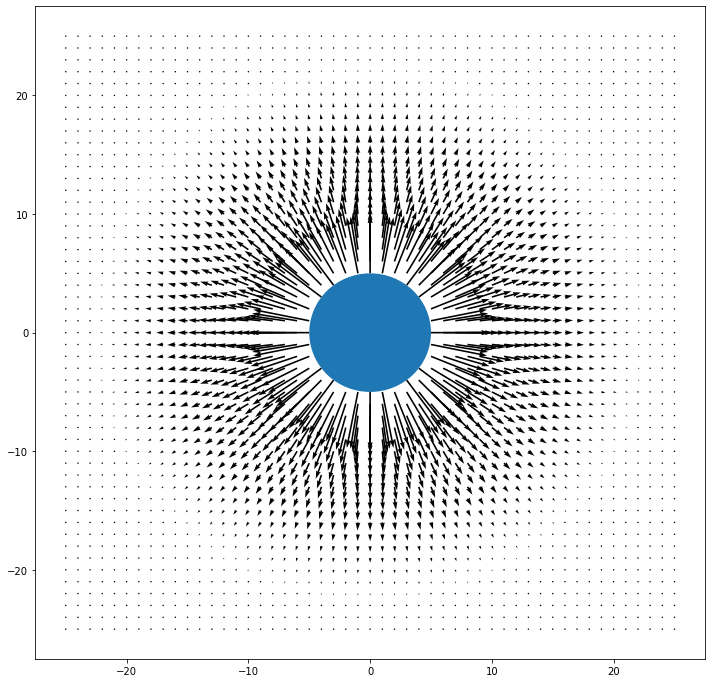

In [164]:
plot_quiver(X, Y, circles, del_x, del_y)

## Problem 3
**Combined potential**

In [165]:
def get_quiver(X, Y, goal_x, goal_y, goal_r, obs_x, obs_y, obs_r, s, alpha, beta):
    """
    Generates gradients for obstacles anf goal combined

    Parameters
    ----------
    X : np.linspace
    Y : np.linspace
    goal_x : float
    goal_y : float
    goal_r : float
    obs_x : list
    obs_y : list
    obs_r : list
    s : float
    alpha : float
    beta : float

    Returns
    -------
    del_x : 2D array
    del_y : 2D array
    """
    del_x, del_y = avoid_obstacle(X, Y, obs_x, obs_y, obs_r, s, beta)
    del_x1, del_y1 = go_to_goal(X, Y, goal_x, goal_y, goal_r, s, alpha)
    
    return del_x+del_x1, del_y+del_y1

In [166]:
X, Y = make_space(40)
# Goal at (10, 10)
goal_x = 10
goal_y = 10
goal_r = 5
# Obstacle at (-15, -20)
obs_x = [-15]
obs_y = [-20]
obs_r = [5]

alpha = 1
beta = 400

s = 20

In [167]:
del_x, del_y = get_quiver(X, Y, goal_x, goal_y, goal_r, obs_x, obs_y, obs_r, s, alpha, beta)
circles = get_circles(goal_x, goal_y, goal_r, obs_x, obs_y, obs_r)

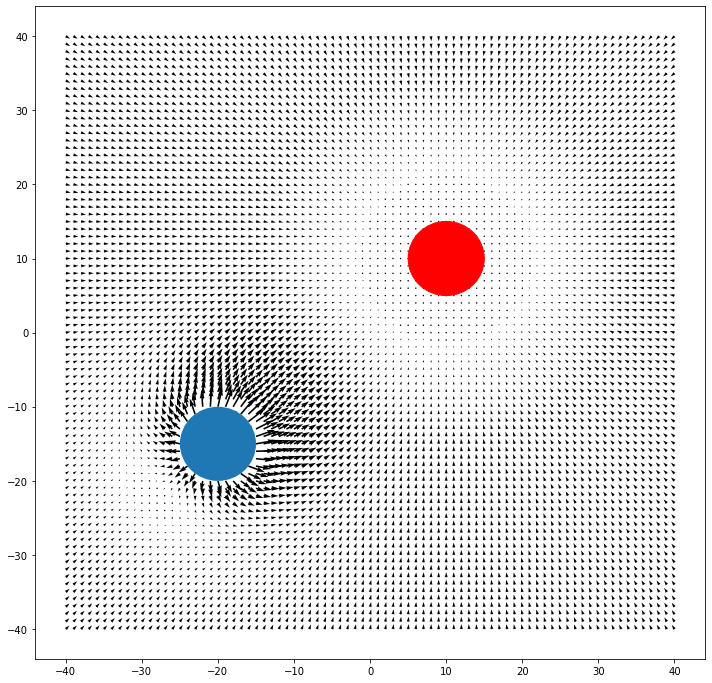

In [168]:
plot_quiver(X, Y, circles, del_x, del_y)

## Problem 4
**Path taken by a robot**

In [169]:
def gradient_descent(X, Y, start_x, start_y, goal_x, goal_y, goal_r, obs_x, obs_y, obs_r, s, 
                     alpha, beta, step_size):
    """
    Generates the path for the agent using gradient descent

    Parameters
    ----------
    X : np.linspace
    Y : np.linspace
    start_x : float
        agent starting x coordinate
    start_y : float
        agent starting y coordinate
    goal_x : float
    goal_y : float
    goal_r : float
    obs_x : list
    obs_y : list
    obs_r : list
    s : float
    alpha : float
    beta : float
    step_size : float
        gradient descent step size

    Returns
    -------
    None.
    """
    x_traj = [start_x]
    y_traj = [start_y]
    count = 0
    while (np.sqrt((start_x-goal_x)**2 + (start_y-goal_y)**2) > goal_r):
        
        dist = np.sqrt((start_x-goal_x)**2 + (start_y-goal_y)**2)
        theta = np.arctan2(start_y-goal_y, start_x-goal_x)
        
        del_x_goal, del_y_goal = seek_goal(dist, theta, goal_r, alpha, s)
        
        del_x_obs = 0
        del_y_obs = 0
        
        for a in range(len(obs_x)):
            dist = np.sqrt((start_x-obs_x[a])**2 + (start_y-obs_y[a])**2)
            theta = np.arctan2((start_y-obs_y[a]), (start_x-obs_x[a]))
            del_x, del_y = repel(dist, theta, obs_r[a], beta, s)
            del_x_obs += del_x 
            del_y_obs += del_y
            
        start_x += (del_x_goal + del_x_obs)*step_size
        start_y += (del_y_goal + del_y_obs)*step_size
            
        x_traj.append(start_x)
        y_traj.append(start_y)
        count += 1
        
        if (count>5000):
            break
        
    return x_traj, y_traj

In [170]:
def plot(X, Y, circles, traj_x, traj_y, del_x, del_y):
#     figure, axes = plt.subplots() 
    plt.figure(figsize=(15,15))
    plt.quiver(X, Y, del_x, del_y)
    plot_circles(circles)
    plt.plot(traj_y, traj_x, color='black')
    plt.show()

In [171]:
X, Y = make_space(40)
start_x = -40
start_y = -40

goal_x = 10
goal_y = 10
goal_r = 5

obs_x = [-15]
obs_y = [-20]
obs_r = [5]

alpha = 1
beta = 300

s = 20
step_size = 0.1

In [172]:
del_x, del_y = get_quiver(X, Y, goal_x, goal_y, goal_r, obs_x, obs_y, obs_r, s, alpha, beta)
circles = get_circles(goal_x, goal_y, goal_r, obs_x, obs_y, obs_r)

In [173]:
traj_x, traj_y = gradient_descent(X, Y, start_x, start_y, goal_x, goal_y, goal_r, obs_x, obs_y, obs_r, s, 
                                  alpha, beta, step_size)

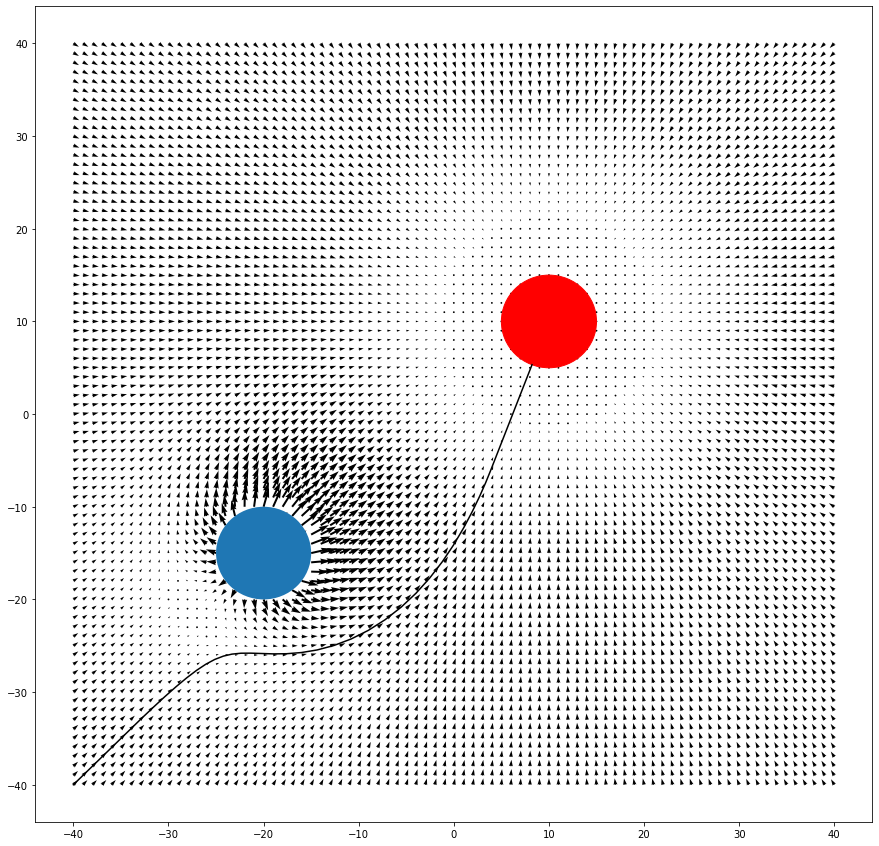

In [174]:
plot(X, Y, circles, traj_x, traj_y, del_x, del_y)

## Problem 5
**Multiple obstacles**

2 obstacles:

In [175]:
def plot_multiple_obstacles(start_x=-100, start_y=-100, 
                            goal_x=50, goal_y=50, goal_r=5, num_obstacles=2):
    
    X, Y = make_space(100)

    obs_x = []
    obs_y = []
    obs_r = []

    while True:
        ox = np.random.randint(-80, 80)
        oy = np.random.randint(-80, 80)
        o_r = np.random.randint(1, 6)
        if (np.hypot(goal_x-ox, goal_y-oy) > (goal_r+o_r+5)):
            obs_x.append(ox)
            obs_y.append(oy)
            obs_r.append(o_r)

        if (len(obs_x) == num_obstacles):
            break

    alpha = 1
    beta = 300

    s = 20
    step_size = 0.1

    del_x, del_y = get_quiver(X, Y, goal_x, goal_y, goal_r, obs_x, obs_y, obs_r, s, alpha, beta)
    circles = get_circles(goal_x, goal_y, goal_r, obs_x, obs_y, obs_r)

    traj_x, traj_y = gradient_descent(X, Y, start_x, start_y, goal_x, goal_y, goal_r, obs_x, obs_y, obs_r, s, 
                                      alpha, beta, step_size)

    plot(X, Y, circles, traj_x, traj_y, del_x, del_y)

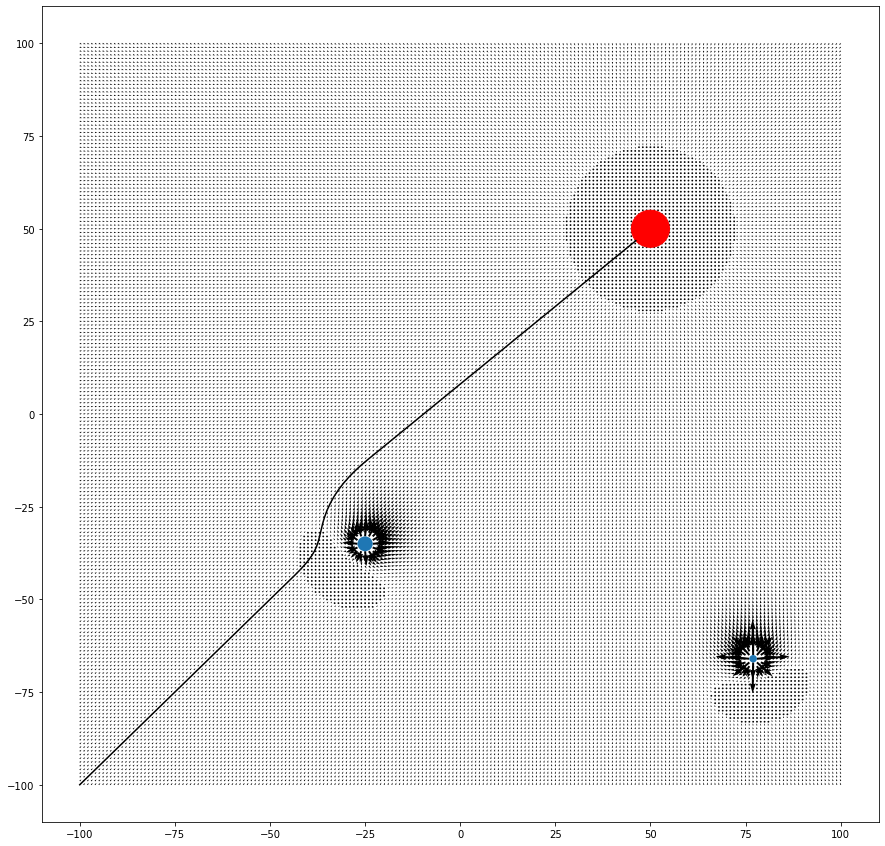

In [176]:
plot_multiple_obstacles(start_x=-100, start_y=-100, goal_x=50, goal_y=50, goal_r=5, num_obstacles=2)

3 obstacles:

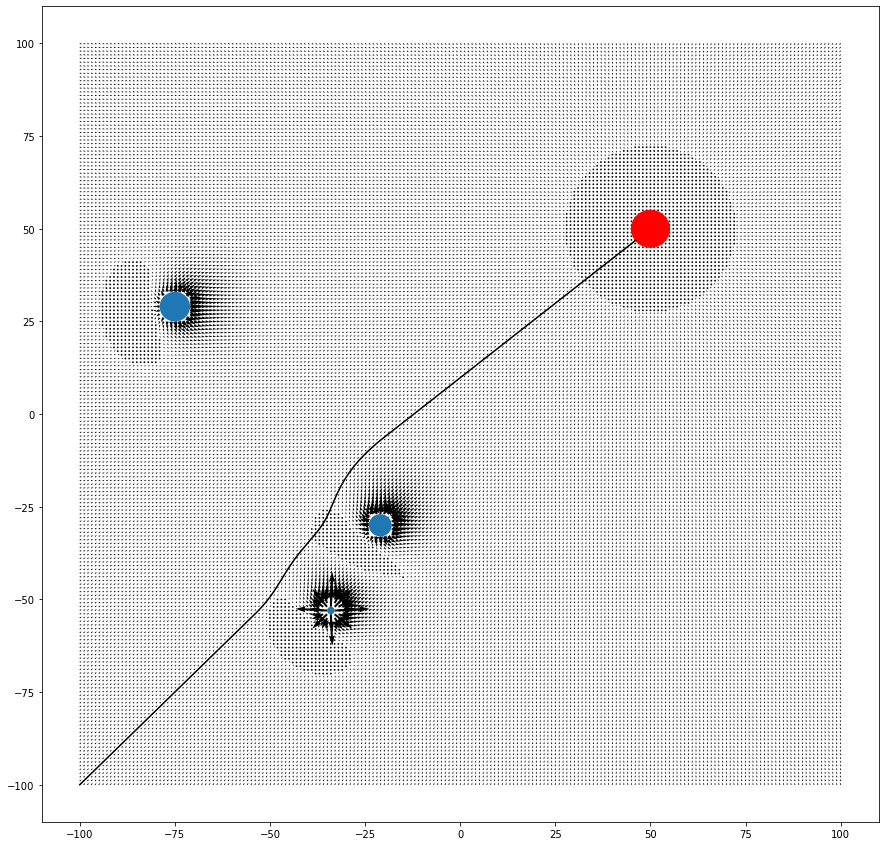

In [178]:
plot_multiple_obstacles(start_x=-100, start_y=-100, goal_x=50, goal_y=50, goal_r=5, num_obstacles=3)

4 obstacles:

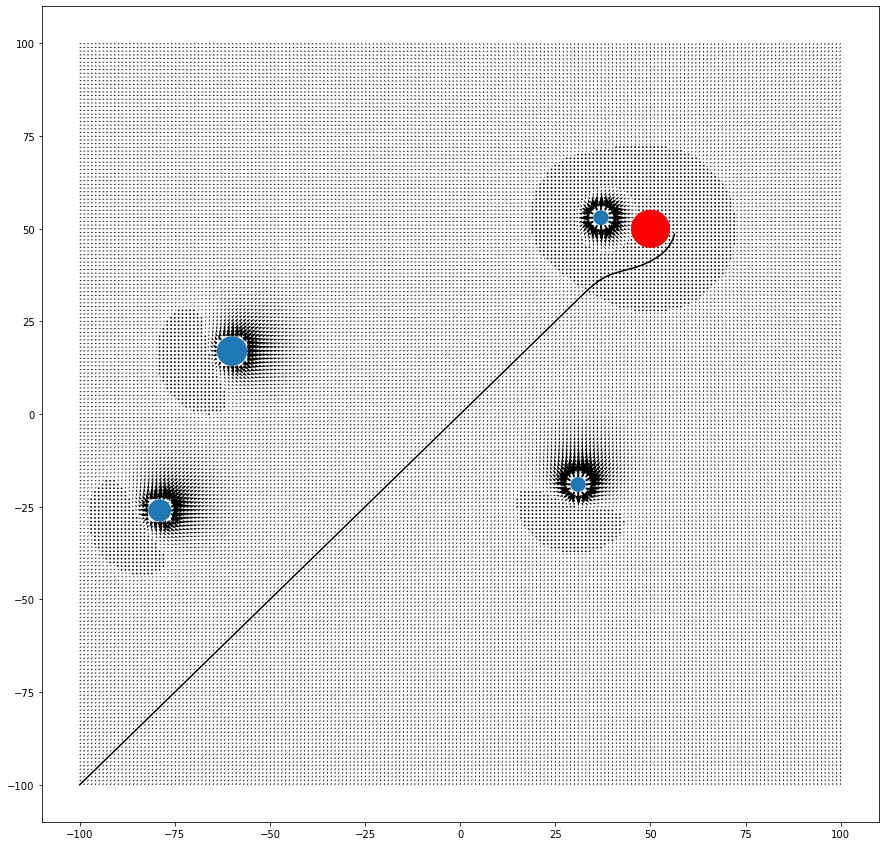

In [183]:
plot_multiple_obstacles(start_x=-100, start_y=-100, goal_x=50, goal_y=50, goal_r=5, num_obstacles=4)

5 obstacles:

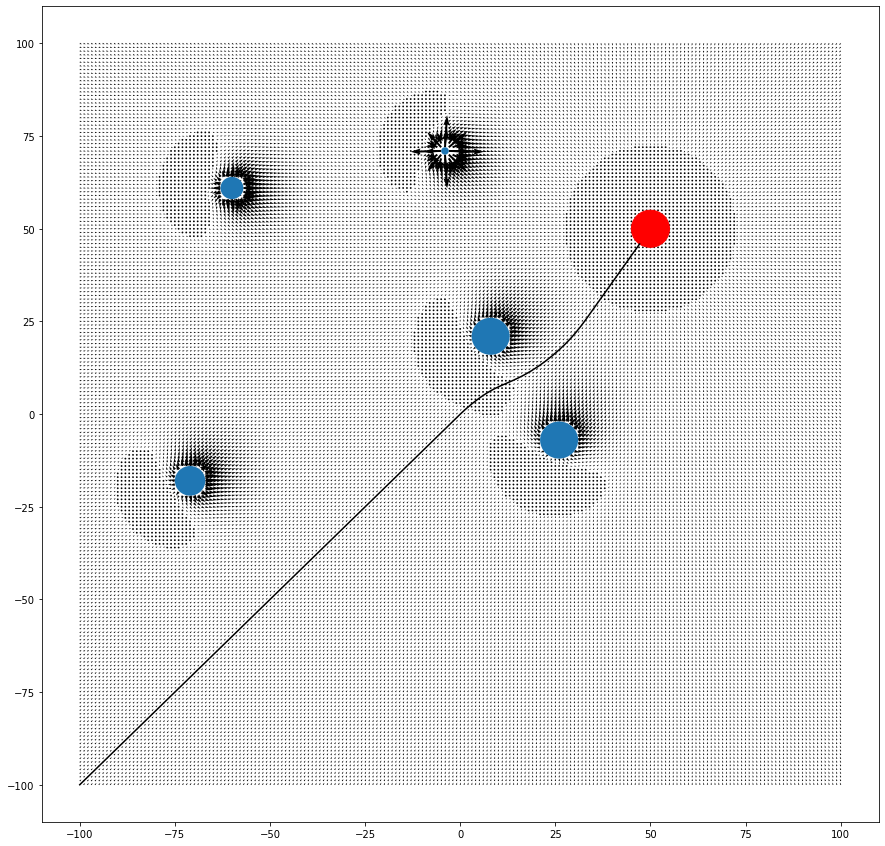

In [188]:
plot_multiple_obstacles(start_x=-100, start_y=-100, goal_x=50, goal_y=50, goal_r=5, num_obstacles=5)

6 obstacles:

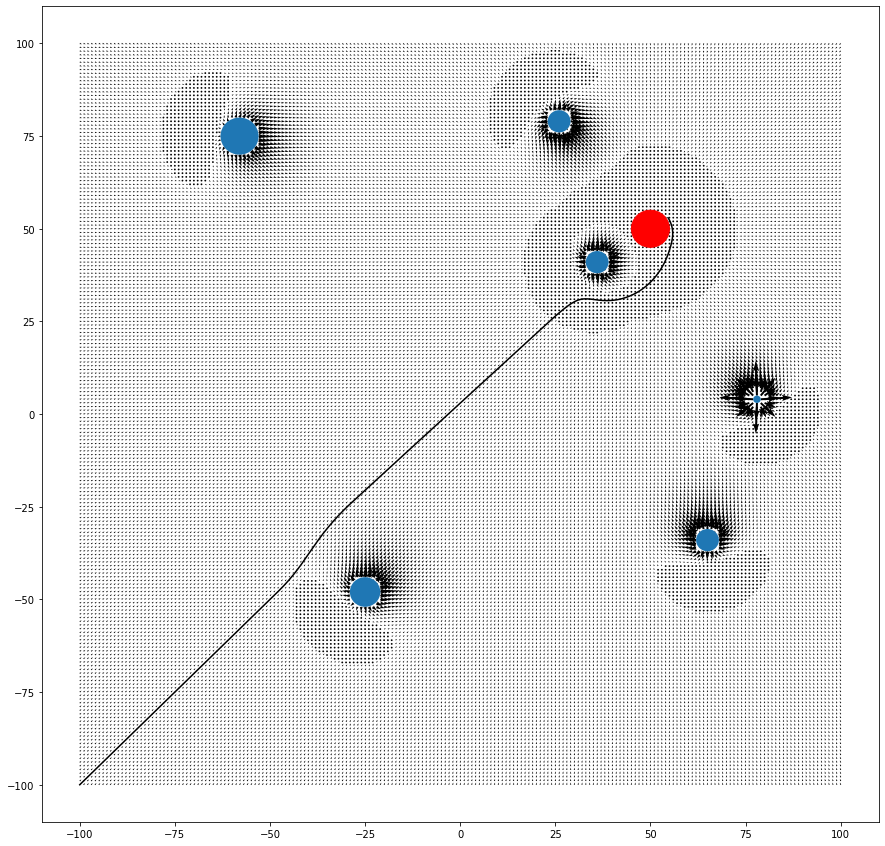

In [190]:
plot_multiple_obstacles(start_x=-100, start_y=-100, goal_x=50, goal_y=50, goal_r=5, num_obstacles=6)

7 obstacles:

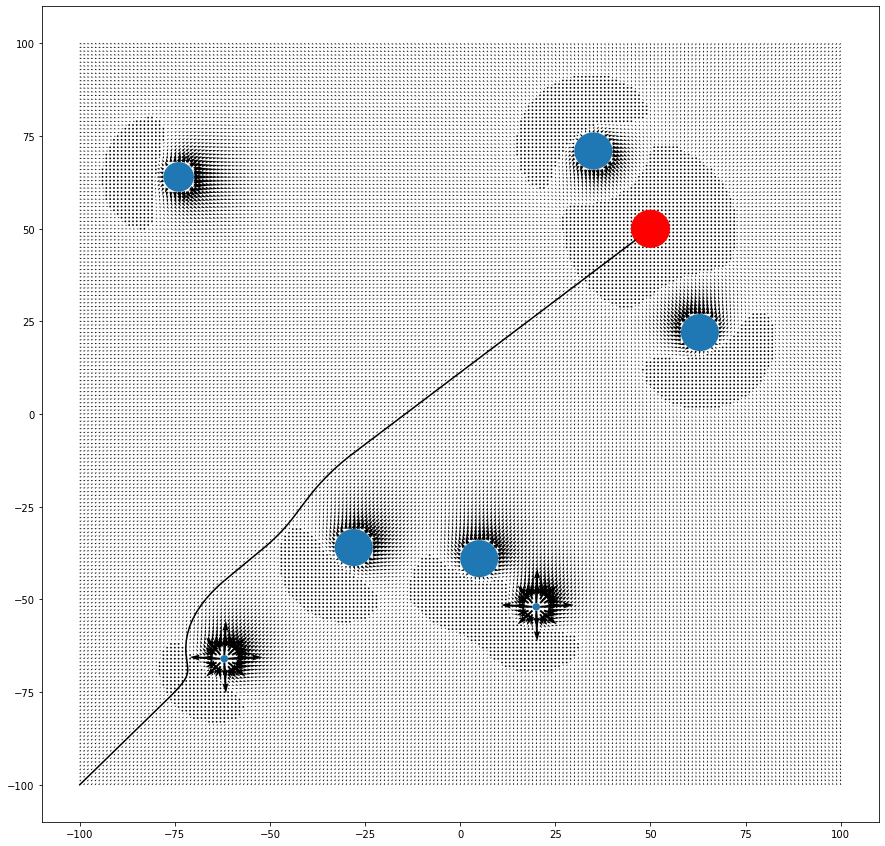

In [192]:
plot_multiple_obstacles(start_x=-100, start_y=-100, goal_x=50, goal_y=50, goal_r=5, num_obstacles=7)

8 obstacles:

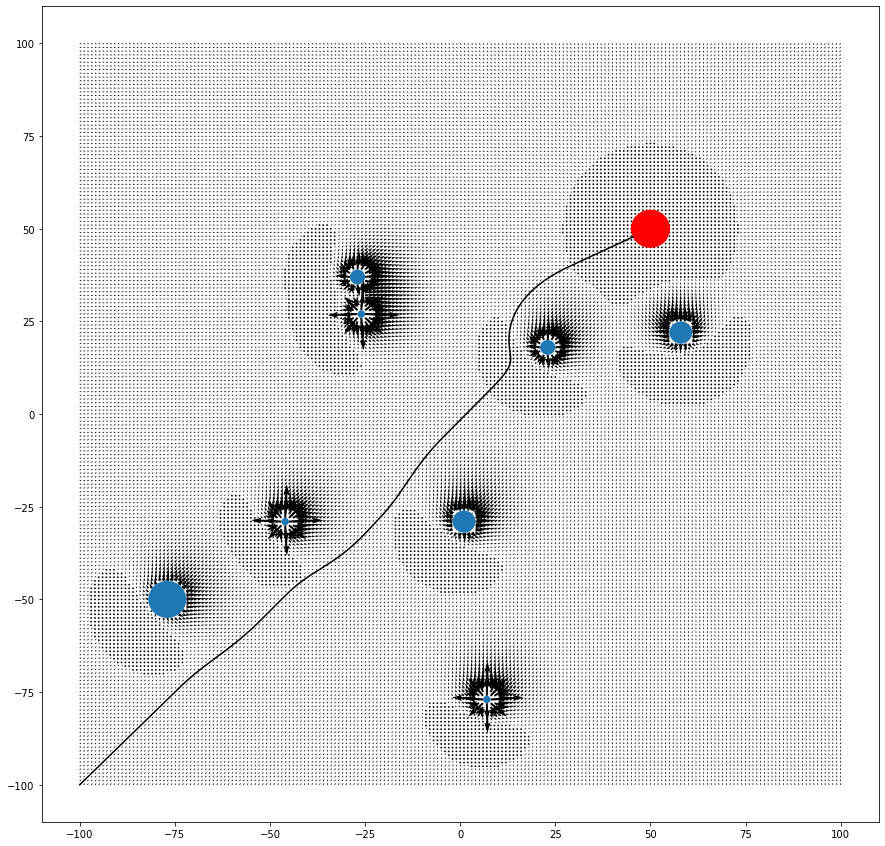

In [194]:
plot_multiple_obstacles(start_x=-100, start_y=-100, goal_x=50, goal_y=50, goal_r=5, num_obstacles=8)

9 obstacles:

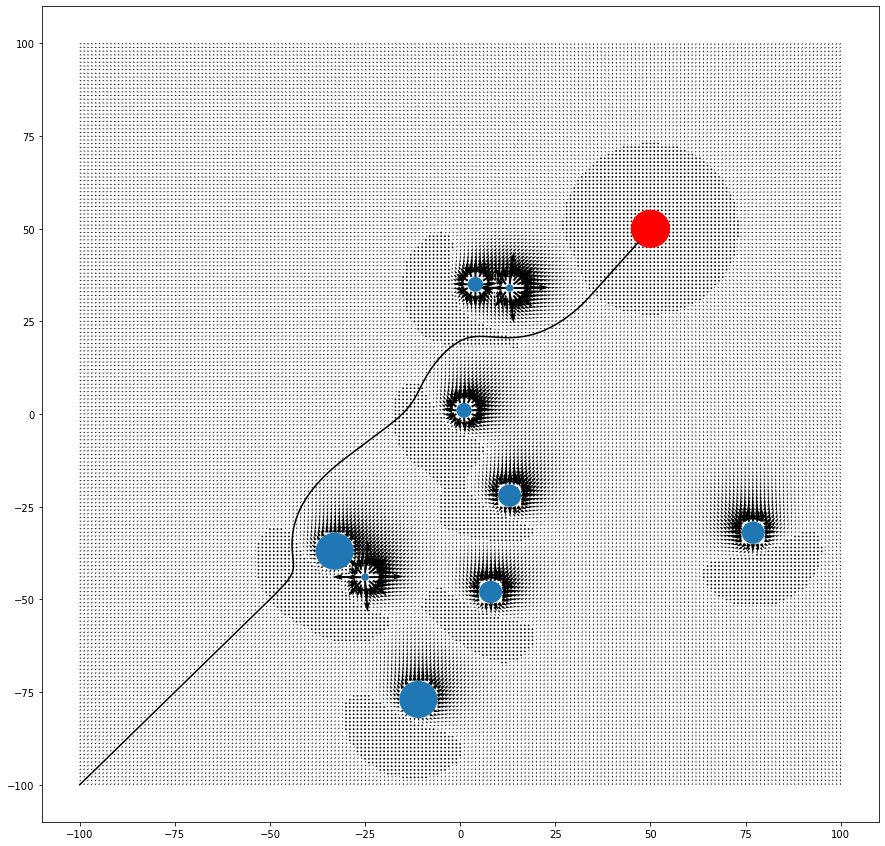

In [197]:
plot_multiple_obstacles(start_x=-100, start_y=-100, goal_x=50, goal_y=50, goal_r=5, num_obstacles=9)

10 obstacles:

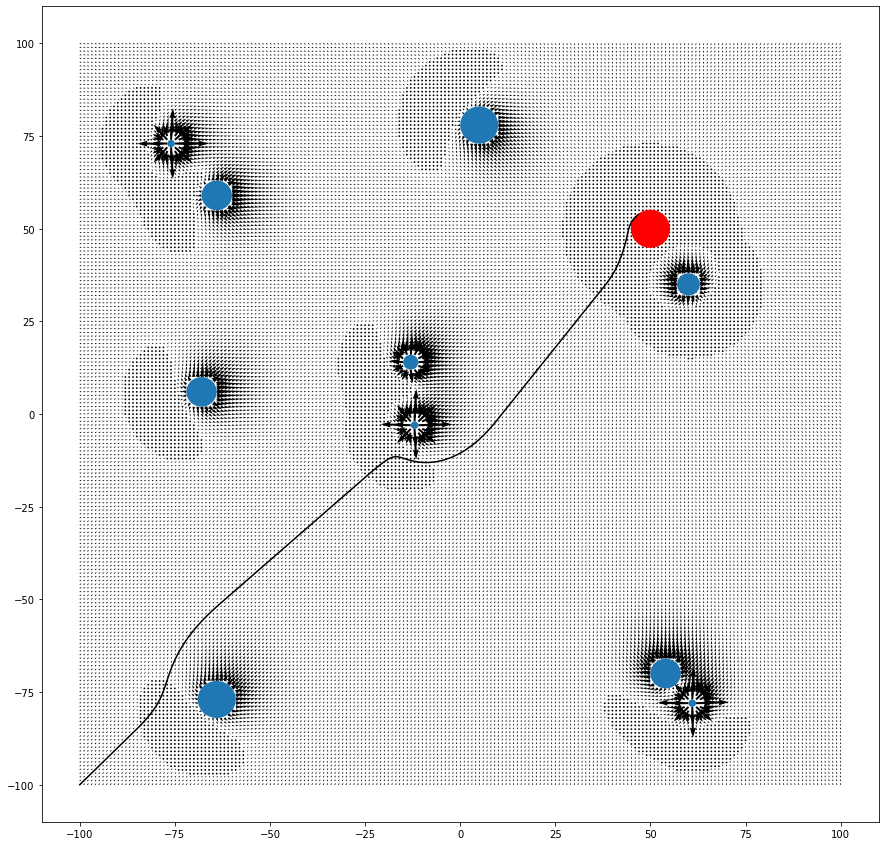

In [207]:
plot_multiple_obstacles(start_x=-100, start_y=-100, goal_x=50, goal_y=50, goal_r=5, num_obstacles=10)

20 obstacles:

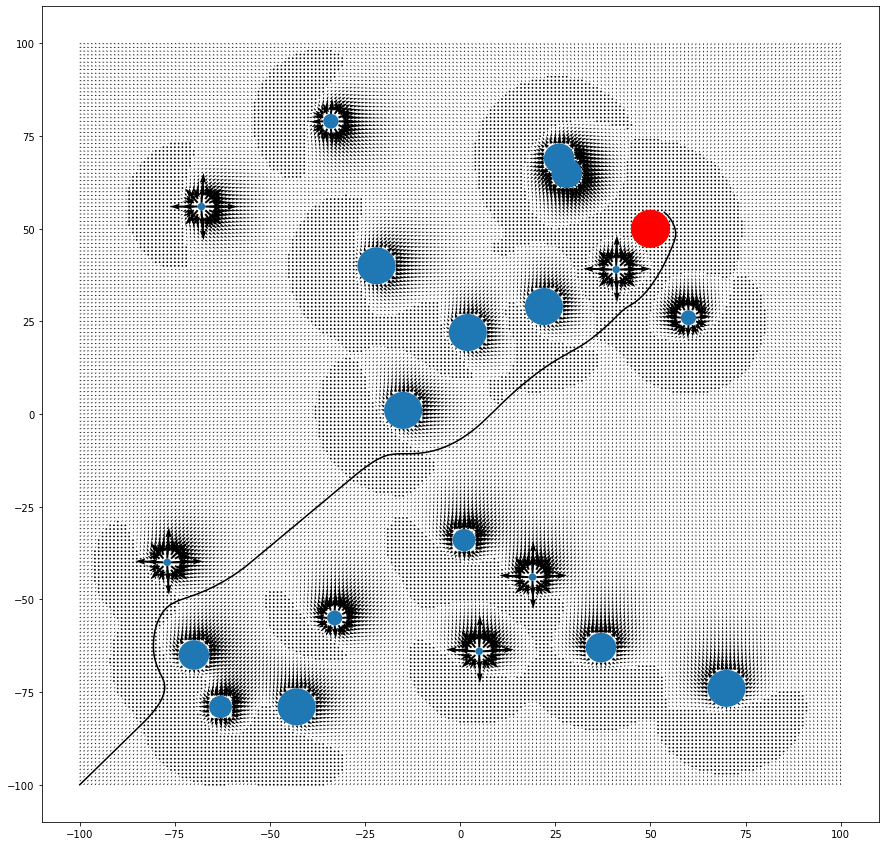

In [208]:
plot_multiple_obstacles(start_x=-100, start_y=-100, goal_x=50, goal_y=50, goal_r=5, num_obstacles=20)